In [4]:
import sys
# print(sys.path)
sys.path.append("..")
# print(sys.path)

In [12]:
# Magic for loading edited .py files 
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
%reload_ext autoreload

In [5]:
import numpy as np
import torch
import torch.nn as nn
from torch.nn import init 
from torch.nn import functional as F 
import math
import argparse
import random
import os
import time
import gym
import neurogym as ngym
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from neurogym.wrappers import ScheduleEnvs
from neurogym.wrappers.block import MultiEnvs
from neurogym.utils.scheduler import RandomSchedule
from neurogym.envs.collections.modcog import * 
from neurogym.envs.collections import modcog
from training.analysis import get_act_act_variances, get_activity, get_performance, get_activity_list, activity_list, activity_by_module
from training.rnn import EI_CTRNN, RNNNet
from training.synaptic_constraints import hsc_thresh, hsc_update, sheet_dist, dist_cost_update
from training.masks import mask2d, smallworldmask
from modularity.girvan_newman import girvan_newman, spectral_modularity, sort_by_cluster, merge_dicts, plot_assoc, Q_star_act_act_cor, Q_star_wTw

import warnings
warnings.filterwarnings('ignore')

# Training networks with heterosynaptic competition

RNNNet(
  (rnn): EI_CTRNN(
    (input2h): Linear(in_features=53, out_features=400, bias=True)
    (h2h): Linear(in_features=400, out_features=400, bias=True)
  )
  (fc): Linear(in_features=400, out_features=17, bias=True)
)
Initial weight matrix:


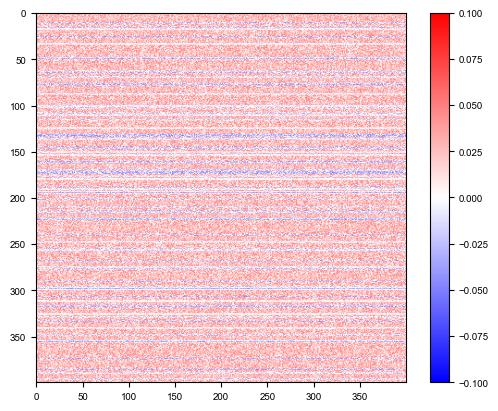

200 loss: 6640344789189975052553636009196657938562809358880392139735419442707051429557530787840.00000
Task/Train time 5.9/97.7 ms/step
200 perf: 0.20
Weight correlations modularity: 0.2309


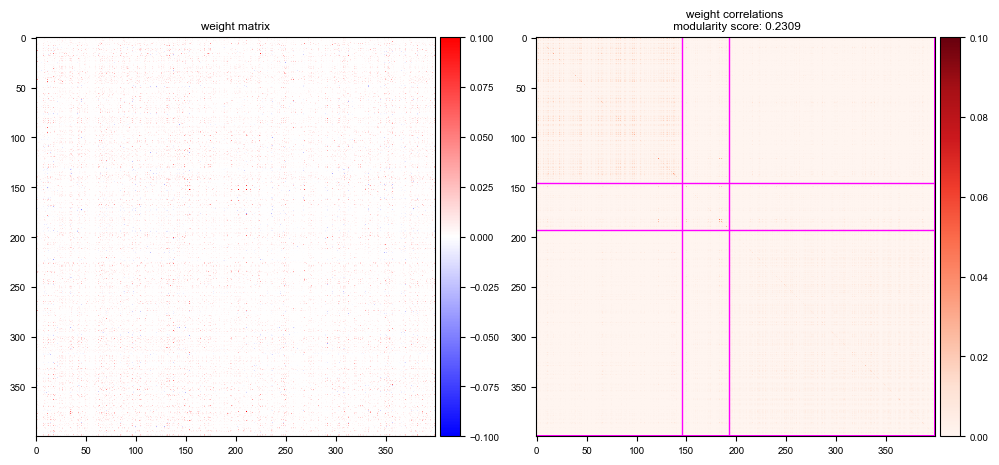

KeyboardInterrupt: 

In [4]:
# RNN training params
hidden_size=20**2
train_steps=20_000
batch_size = 4
lr = 1e-3

# Mask params 
N_x = int(np.sqrt(hidden_size))
N_y = int(np.sqrt(hidden_size))
mask = False
small_world = False
cutoff_local = False 
cutoff_large = False 
d = False
periodic = False

# Heterosynaptic competition params 
hsc_rule=True
ei_ratio=0.8
W_max_E = w_max  = 1 
W_max_I = W_max_E*(1-ei_ratio)
epsilon=.1
eta = lr*1e2
l1 = 1  # hsc loss regularization param

# Long-range wiring cost params
lrwc = False 
d_thresh = 3  # supposed to be ~ smallworld with local=3 
delta = 0.00008


torch.set_default_tensor_type(torch.DoubleTensor)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

envs = [go(), anti(), rtgo(), rtanti(), dlygo(), dlyanti(), dm1(), dm2(), ctxdm1(), ctxdm2(), multidm(), dlydm1(), dlydm2(), ctxdlydm1(), ctxdlydm2(), multidlydm(), dms(), dnms(), dmc(), dnmc()]
envs_names = [go, anti, rtgo, rtanti, dlygo, dlyanti, dm1, dm2, ctxdm1, ctxdm2, multidm, dlydm1, dlydm2, ctxdlydm1, ctxdlydm2, multidlydm, dms, dnms, dmc, dnmc]
schedule = RandomSchedule(len(envs))
env = ScheduleEnvs(envs, schedule=schedule, env_input=True, delay_rule_input=False)
dataset = ngym.Dataset(env, batch_size=batch_size, seq_len=100)
ob_size = env.observation_space.shape[0]
act_size = env.action_space.n

model = RNNNet(input_size = ob_size, 
                   hidden_size = N_x * N_y,
                   ei_ratio = ei_ratio,
                   output_size = act_size,
                   dt = env.dt,
                   mask = None
                   )
model = model.to(device)
print(model)

print('Initial weight matrix:')
plt.imshow(model.rnn.h2h.weight.data.detach().cpu().numpy(), cmap = "bwr", vmin = -0.1, vmax = 0.1)
plt.colorbar()
plt.show()

criterion = nn.CrossEntropyLoss() 
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

print_step = 200
running_loss = 0.0 
running_task_time = 0
running_train_time = 0

perfs = []
losses = []
act_act_modularity_scores = []
weights_modularity_scores = []
torch.set_default_tensor_type(torch.DoubleTensor)

if mask: 
    if small_world: 
        mask2d_n = torch.from_numpy(smallworldmask(N_x,N_y,cutoff_local,cutoff_large,periodic))
        mask2d_n = mask2d_n.double()
    else:
        mask2d_n = torch.from_numpy(mask2d(N_x,N_y,d,periodic))
        mask2d_n = mask2d_n.double() 
else:
    mask2d_n = torch.ones(N_x*N_y, N_x*N_y) # equivalent to there being no mask at all 
    mask2d_n = mask2d_n.double()
    
for i in range(train_steps):
    task_time_start = time.time()
    inputs, labels = dataset()
    running_task_time += time.time() - task_time_start
    inputs = torch.from_numpy(inputs).type(torch.double).to(device)
    labels = torch.from_numpy(labels.flatten()).type(torch.long).to(device)

    train_time_start = time.time()
    optimizer.zero_grad()

    # forward + backward + optimize
    outputs, _ = model(inputs)
    loss = criterion(outputs.view(-1, act_size), labels)

    # Heterosynaptic competition regularization 
#     if hsc_rule == True:
#         # v1 
#         ones = torch.ones(model.rnn.h2h.weight.data.shape[0], model.rnn.h2h.weight.data.shape[1])
#         hsc_reg = l1*(torch.sum(relu(torch.sum(torch.abs(model.rnn.h2h.weight.data), axis=0) - W_max)) + torch.sum(relu(torch.sum(torch.abs(model.rnn.h2h.weight.data), axis=1) - W_max))
#                      + torch.sum(relu(torch.abs(model.rnn.h2h.weight.data) - w_max*ones)))
#         loss = criterion(outputs.view(-1, act_size), labels) + hsc_reg
        
#         # v2 
#         W = torch.abs(model.rnn.h2h.weight.data)
#         ones = torch.ones(W.shape[0], 1)
#         out_pen = relu(ones.T@W - W_max*ones.T)@ones 
#         in_pen = ones.T@relu(W@ones - W_max*ones)
#         upper = ones.T@relu(W - w_max*ones@ones.T)@ones
#         hsc_reg = out_pen**2 + in_pen**2 + upper**2
#         loss = (1-l1)*criterion(outputs.view(-1, act_size), labels) + l1*hsc_reg
        
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    optimizer.step()

    # Heterosynaptic competition 
    if hsc_rule:
        hidden_sgns = model.rnn.hidden_sgns
        e_neurons = (hidden_sgns == 1).nonzero().squeeze()
        i_neurons = (hidden_sgns == -1).nonzero().squeeze()
        model.rnn.h2h.weight.data[e_neurons,:], model.rnn.h2h.weight.data[i_neurons,:] = hsc_update(model, ei_ratio, W_max_E, W_max_I, w_max, epsilon, eta)
    
    # Long-range wiring cost penalty
    if lrwc: 
        hidden_sgns = model.rnn.hidden_sgns
        e_neurons = (hidden_sgns == 1).nonzero().squeeze()
        i_neurons = (hidden_sgns == -1).nonzero().squeeze()
        model.rnn.h2h.weight.data[e_neurons,:], model.rnn.h2h.weight.data[i_neurons,:] = dist_cost_update(model, N_x, N_y, d_thresh, delta)
    
    # Anatomical mask 
    if mask: 
        model.rnn.h2h.weight.data = model.rnn.h2h.weight.data*(mask2d_n.to(device))

    running_train_time += time.time() - train_time_start

     # print statistics
    running_loss += loss.item()
    if i % print_step == (print_step - 1):
        print('{:d} loss: {:0.5f}'.format(i + 1, running_loss / print_step))
        losses.append(running_loss/print_step)

        if True:
            print('Task/Train time {:0.1f}/{:0.1f} ms/step'.format(
                    running_task_time / print_step * 1e3,
                    running_train_time / print_step * 1e3))
            running_task_time, running_train_time = 0, 0

        # compute performance over full task set 
        perf = get_performance(model, env, num_trial=200, device=device)
        perfs.append(perf)
        running_loss = 0.0
        print('{:d} perf: {:0.2f}'.format(i + 1, perf))

        # Compute Q modularity scores
        # Q_act_act, isrt_act_act, p_act_act, adj_var = Q_star_act_act_cor(model, N_x, envs, env, device, num_trial=100)
        Q_wTw, isrt_wTw, p_wTw, wTw = Q_star_wTw(model)
        p_wTw = p_wTw.cpu()
        wTw = wTw.cpu()
        # act_act_modularity_scores.append(Q_act_act)
        weights_modularity_scores.append(Q_wTw)
        # print(f'Activity correlations modularity: {Q_act_act:0.4f}')
        print(f'Weight correlations modularity: {Q_wTw:0.4f}')

        #fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (10,10), tight_layout=True)
        fig, (ax1, ax3) = plt.subplots(1, 2, figsize = (10,10), tight_layout=True)

        
        im = ax1.imshow(model.rnn.h2h.weight.data.detach().cpu().numpy(), cmap = "bwr", vmin = -0.1, vmax = 0.1)
        divider = make_axes_locatable(ax1)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        #plot_assoc(adj_var[isrt_act_act,:][:,isrt_act_act], lines_at=p_act_act.sum(0), line_args={'linewidth' : 1, 'color':'magenta'}, colorbar=True, ax=ax2)
        plot_assoc(wTw[isrt_wTw,:][:,isrt_wTw], lines_at=p_wTw.sum(0), line_args={'linewidth' : 1, 'color':'magenta'}, vmin=0.0, vmax=.1, colorbar=True, ax=ax3, cmap="Reds")
        
        ax1.set_title('weight matrix')
        #ax2.set_title(f'activity correlations \n modularity score: {Q_act_act:.4f}')
        ax3.set_title(f'weight correlations \n modularity score: {Q_wTw:.4f}')
        plt.show()

print('Finished training')

# Neural activity

In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

tasks = [go(), anti(), rtgo(), rtanti(), dlygo(), dlyanti(), dm1(), dm2(), ctxdm1(), ctxdm2(), multidm(), dlydm1(), dlydm2(), ctxdlydm1(), ctxdlydm2(), multidlydm(), dms(), dnms(), dmc(), dnmc()]
schedule = SequentialSchedule(len(tasks)) # must use SequentialSchedule for activity_list() 
env = ScheduleEnvs(tasks, schedule=schedule, env_input=True, delay_rule_input=False)
ob_size = env.observation_space.shape[0]
act_size = env.action_space.n

N_x = N_y = 20
cutoff_local = cutoff_large = 3 
periodic = False 
mask2d_n = torch.from_numpy(smallworldmask(N_x,N_y,cutoff_local,cutoff_large,periodic)).double()
ei_ratio = .8

net = RNNNet(input_size = ob_size, 
                   hidden_size = N_x * N_y,
                   ei_ratio = ei_ratio,
                   output_size = act_size,
                   dt = env.dt,
                   mask = mask2d_n
                   )

net.load_state_dict(torch.load(f'/Users/alexnegron/cogtasks_rnn_modularity/trained_models/RNN_hsize=400_SmallWorldMask_local=3_large=3_HSC_Wmax=1_epsilon=0.1_EIratio=0.8_LR=0.001_Tasks=yang20_RunID=1.pt', map_location=torch.device(device)))

<All keys matched successfully>

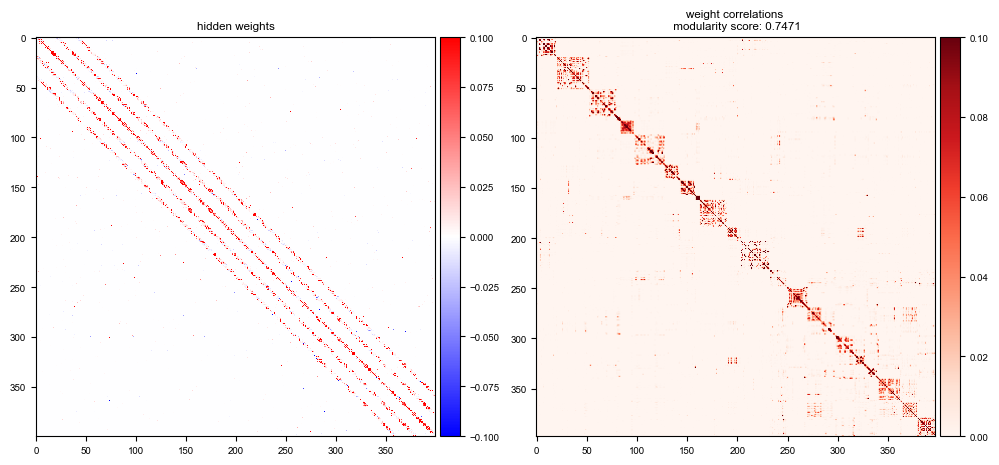

In [21]:
w = net.rnn.h2h.weight.data.detach().cpu().numpy()
Q_wTw, isrt_wTw, p_wTw, wTw = Q_star_wTw(net)
p_wTw = p_wTw.cpu()
wTw = wTw.cpu()


fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10,10), tight_layout=True)
im = ax1.imshow(w, cmap = "bwr", vmin = -0.1, vmax = 0.1)
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax)
# plot_assoc(wTw[isrt_wTw,:][:,isrt_wTw], lines_at=p_wTw.sum(0), line_args={'linewidth' : 1, 'color':'magenta'}, vmin=0.0, vmax=.1, colorbar=True, ax=ax2, cmap="Reds")
plot_assoc(wTw[isrt_wTw,:][:,isrt_wTw], vmin=0.0, vmax=.1, colorbar=True, ax=ax2, cmap="Reds")
ax1.set_title(f'hidden weights')
ax2.set_title(f'weight correlations \n modularity score: {Q_wTw:.4f}')
plt.savefig('/Users/alexnegron/cogtasks_rnn_modularity/figs/weights1.pdf', bbox_inches='tight', transparent=True)
plt.show()

In [16]:
tasks = [go(), anti(), rtgo(), rtanti(), dlygo(), dlyanti(), dm1(), dm2(), ctxdm1(), ctxdm2(), multidm(), dlydm1(), dlydm2(), ctxdlydm1(), ctxdlydm2(), multidlydm(), dms(), dnms(), dmc(), dnmc()]
schedule = SequentialSchedule(len(tasks)) # must use SequentialSchedule for get_activity_list() 
env = ScheduleEnvs(tasks, schedule=schedule, env_input=True, delay_rule_input=False)
#activity_list, activity_per_period_list = activity_list(net, tasks, env, device, num_trial=100)
activity_list_by_module, activity_per_period_list_by_module = activity_by_module(net, tasks, env, device, p_wTw, num_trial=300)

Notes how to access these objects: 
- `activity_per_period_list_by_module[m][1]` returns the indices of the neurons in module `m`
- `activity_per_period_list_by_module[m][0][i]` is a dictionary for the i-th trial, where each key is the name of a task
- `activity_per_period_list_by_module[m][0][i][task]` is a dictionary where each key is the name of a period belonging to the selected `task`
- `activity_per_period_list_by_module[m][0][i][task][period]` is the activity array itself; note the activity recorded here are of the neurons only in module `m`. This array has shape `(# timesteps in period, 1, # neurons in module m)`

## Module activity over time

In [31]:
from matplotlib import animation
from IPython.display import HTML
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage.filters import gaussian_filter1d
from matplotlib.lines import Line2D
import matplotlib.gridspec as grd
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns 

In [32]:
def module_act_at_t(mat, P, t_i, isrt, activity_list_by_module, task_name, period, line_args):
    num_trials = len(activity_list_by_module[0][0])
    
    mod_bdrys = p_wTw.sum(0)[p_wTw.sum(0).nonzero()].detach().cpu().numpy().astype(int)
    isrt_arr = isrt.detach().cpu().numpy()

    list_avg_act_module = []
    for which_mod in range(len(mod_bdrys)):
        avg_act_module = np.mean(np.array([activity_list_by_module[which_mod][0][i][task_name].squeeze(axis=1) for i in range(num_trials)]), axis=0)
        list_avg_act_module.append(avg_act_module)
    avg_acts_by_module = np.hstack(list_avg_act_module)

    t_idxs = np.arange(avg_acts_by_module.shape[0])
    
    ax1 = plt.subplot(gs[2])
    p1 = ax1.imshow(mat[isrt_arr,:][:,isrt_arr], vmin=0.0, vmax=.1, cmap="Reds", aspect='auto')
    
            
    # color bar in it's own axis
    colorAx1 = plt.subplot(gs[3])
    cb1 = plt.colorbar(p1, cax = colorAx1)
    ax1.set_xticks([], []) 
    ax1.set_yticks([], []) 

    ax2 = plt.subplot(gs[0])
    ax2.xaxis.set_ticks_position('bottom')
    ax2.yaxis.set_ticks_position('left')
    p2 = ax2.imshow(np.vstack([avg_acts_by_module[t_idxs[t_i], :]]*t_idxs.shape[0]), vmin=0., vmax=1., aspect='auto', cmap="binary")
    
    
    sz = len(mat)
    sz2 = len(avg_acts_by_module)
    line_args = merge_dicts({'color': 'r', 'linewidth':0.5}, line_args)
    for x in np.cumsum(P.sum(0))-0.5:
        #ax1.plot([-.5, sz-.5], [x, x], **line_args)
        ax1.plot([x, x], [-.5, sz-.5], **line_args)
        #ax2.plot([-.5, sz-.5], [x, x], **line_args)
        ax2.plot([x, x], [-.5, sz2-.5], **line_args)
    
    
    colorAx2 = plt.subplot(gs[1])
    cb2 = plt.colorbar(p2, cax = colorAx2)
    ax2.set_xticks([], []) 
    ax2.set_yticks([], [])
    ax2.text(0, 32, 't = {:.2f}'.format(int(t_idxs[t_i]+1)*100), fontdict={'fontsize':14})

     
    #plt.show()

In [58]:
avg_act_module = np.mean(np.array([activity_list_by_module[0][0][i]['ctxdm1'].squeeze(axis=1) for i in range(100)]), axis=0)


In [65]:
gs = grd.GridSpec(2, 2, height_ratios=[1,10], width_ratios=[16,1], wspace=0.1)
fig = plt.figure(figsize=(10,5))
ax1 = plt.subplot(gs[2])
ax2 = plt.subplot(gs[0])

def animate(i):
 
    ax2.clear()
    
    t_i = i
    isrt=isrt_wTw
    P=p_wTw
    mat=wTw
    task_name='multidlydm'
    # period='stimulus'
    line_args={'linewidth' : 2, 'color':'magenta'}
    
    num_trials = len(activity_list_by_module[0][0])
    
    mod_bdrys = p_wTw.sum(0)[p_wTw.sum(0).nonzero()].detach().cpu().numpy().astype(int)
    isrt_arr = isrt.detach().cpu().numpy()

    list_avg_act_module = []
    for which_mod in range(len(mod_bdrys)):
        avg_act_module = np.mean(np.array([activity_list_by_module[which_mod][0][i][task_name].squeeze(axis=1) for i in range(num_trials)]), axis=0)
        list_avg_act_module.append(avg_act_module)
    avg_acts_by_module = np.hstack(list_avg_act_module)

    t_idxs = np.arange(avg_acts_by_module.shape[0])
    #print(t_idxs.shape)
    
    # create a 2 X 2 grid 
    
    p1 = ax1.imshow(mat[isrt_arr,:][:,isrt_arr], vmin=0.0, vmax=.1, cmap="Reds", aspect='auto')
    
    
            
    # color bar in it's own axis
    colorAx1 = plt.subplot(gs[3])
    cb1 = plt.colorbar(p1, cax = colorAx1)
    ax1.set_xticks([], []) 
    ax1.set_yticks([], []) 

    
    ax2.xaxis.set_ticks_position('bottom')
    ax2.yaxis.set_ticks_position('left')
    p2 = ax2.imshow(np.vstack([avg_acts_by_module[t_idxs[t_i], :]]*t_idxs.shape[0]), vmin=0., vmax=1., aspect='auto', cmap="binary")
    
    
    sz = len(mat)
    sz2 = len(avg_acts_by_module)
    line_args = merge_dicts({'color': 'r', 'linewidth':0.5}, line_args)
    for x in np.cumsum(P.sum(0))-0.5:
        #ax1.plot([-.5, sz-.5], [x, x], **line_args)
        ax1.plot([x, x], [-.5, sz-.5], **line_args)
        #ax2.plot([-.5, sz-.5], [x, x], **line_args)
        ax2.plot([x, x], [-.5, sz2-.5], **line_args)
    
    
    colorAx2 = plt.subplot(gs[1])
    cb2 = plt.colorbar(p2, cax = colorAx2)
    ax2.set_xticks([], []) 
    ax2.set_yticks([], [])
    ax2.text(0, 32, 't = {:.2f}'.format(int(t_idxs[t_i]+1)*100), fontdict={'fontsize':14})    
    ax2.set_title(f'task: {task_name}')
        
    return []


anim = animation.FuncAnimation(fig, 
                               animate,
                               frames=20, 
                               interval=500, 
                               blit=True)


task_name = 'multidlydm'
plt.rcParams['animation.ffmpeg_path'] = '/Users/alexnegron/opt/anaconda3/bin/ffmpeg'
FFwriter = animation.FFMpegWriter()
anim.save(f'/Users/alexnegron/cogtasks_rnn_modularity/figs/module_act_over_time_task={task_name}.mp4', writer=FFwriter)
html = HTML(anim.to_jshtml(default_mode='loop'))
display(html)
plt.close()

### Visualize neural activity in PCA space by trial

In [981]:
def style_3d_ax(ax):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')

In [999]:
activity[1]

array([0.26880177, 0.13341215, 0.25504312, 0.25840594, 0.34657855,
       0.13862177, 0.10183706, 0.        , 0.20640821, 0.        ,
       0.        , 0.39768568, 0.34027089, 0.17970635, 0.13329708])

In [1007]:
activity_list_by_module[module_idx][0][0][task_name].squeeze(axis=1).shape

(20, 56)

In [1037]:
num_tasks

20

In [1038]:
task_names = []
for i in range(num_tasks):
    env.new_trial()    
    task_names.append(env.task.task_name)

In [1039]:
task_names

['go',
 'anti',
 'rtgo',
 'rtanti',
 'dlygo',
 'dlyanti',
 'dm1',
 'dm2',
 'ctxdm1',
 'ctxdm2',
 'multidm',
 'dlydm1',
 'dlydm2',
 'ctxdlydm1',
 'ctxdlydm2',
 'multidlydm',
 'dms',
 'dnms',
 'dmc',
 'dnmc']

In [1044]:
module_idxs = np.arange(len(activity_per_period_list_by_module))

In [1196]:
module_idxs = [0,4]
num_trial = 300
activity = []
for idx in module_idxs:
    activity.append(np.concatenate([activity_list_by_module[idx][0][j][task_name].squeeze(axis=1) for j in range(num_trial)]))

In [1197]:
activity[0].shape

(6000, 56)

In [1185]:
pca_fits = [pca2.fit(act) for act in activity]

In [1186]:
pca_fits[0]

PCA(n_components=2)

In [1244]:
def plot_pca_by_modules(task_names, module_idxs, activity_list, num_trial):
    rows = len(task_names)
    cols = len(module_idxs)
    fig, ax = plt.subplots(rows, cols, figsize=(50,70), squeeze=False)

    
        
    for i in range(len(task_names)):
        task_name = task_names[i]
        activity = []
        for idx in module_idxs:
            activity.append(np.concatenate([activity_list[idx][0][j][task_name].squeeze(axis=1) for j in range(num_trial)]))

        pca2s = [PCA(n_components=2) for _ in range(len(activity))]
        
        for k in range(len(activity)):
            
            pca = pca2s[k].fit(activity[k])
            module_idx = module_idxs[k]
            
            for j in range(num_trial):

                activity_pc2 = pca.transform(activity_list_by_module[module_idx][0][j][task_name].squeeze(axis=1))
                
                
                _ = ax[i,k].plot(activity_pc2[:, 0], activity_pc2[:, 1], alpha=.05, color='black')
                _ = ax[i,k].scatter(activity_pc2[-1, 0], activity_pc2[-1, 1], s=35, marker='>', c='black')
                _ = ax[i,k].scatter(activity_pc2[0, 0], activity_pc2[0, 1], s=35, marker='o', c='black')
                ax[i,k].set_aspect(np.diff(ax[i,k].get_xlim())/np.diff(ax[i,k].get_ylim()))


                ax[i,k].set_title(f'task = {task_name}, mod = {module_idxs[k]}')

        # ax[i,0].set_xlabel('PC 1')
        # ax[i,0].set_ylabel('PC 2')
    plt.tight_layout()
    plt.show()
        
        
        

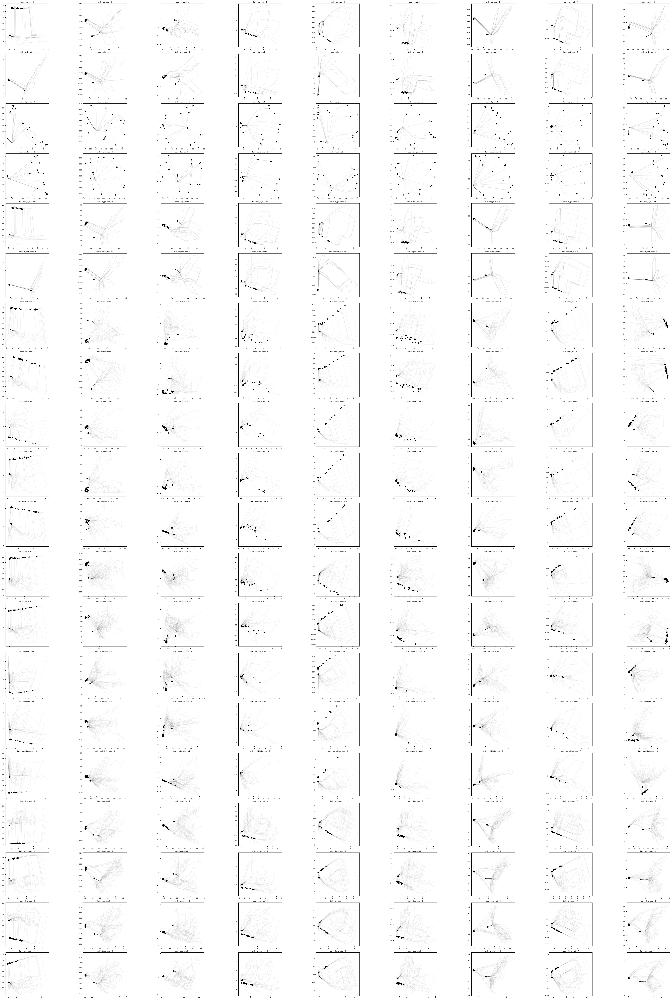

In [1245]:
plot_pca_by_modules(task_names, module_idxs=[0,1,2,3,4,5,6,7,8], activity_list = activity_list_by_module, num_trial=20)

In [2]:
hidden_size = 400
mask = True
small_world = True
cutoff_local = 3
cutoff_large = 3 
config_params = [hidden_size, mask, small_world, cutoff_local, cutoff_large]
modelname = 'RNN'
for param in config_params: 
    modelname = modelname + str(param) + '=' + str(param)

In [3]:
modelname

'RNN400=400True=TrueTrue=True3=33=3'

In [ ]:
1+1

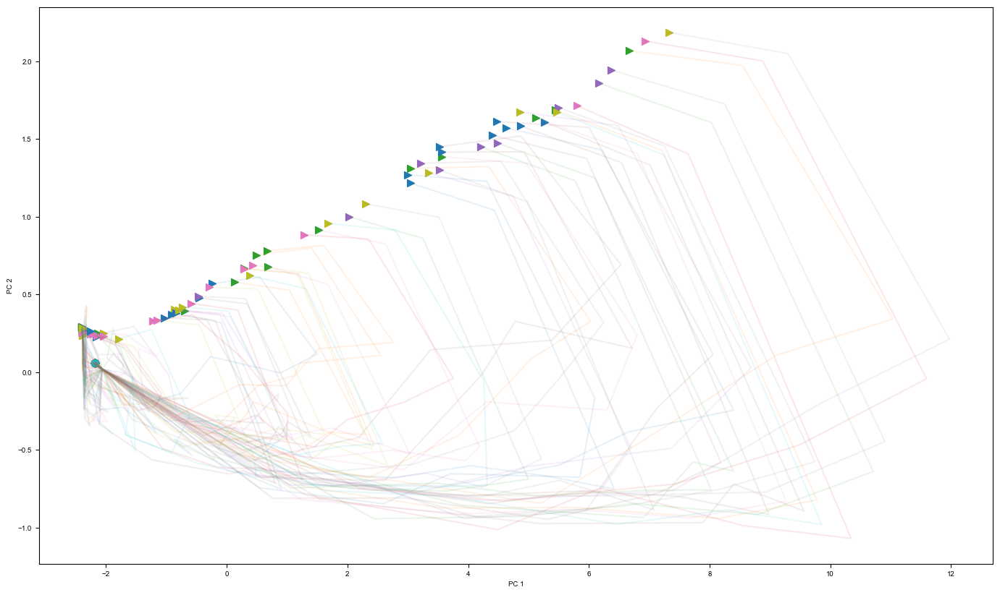

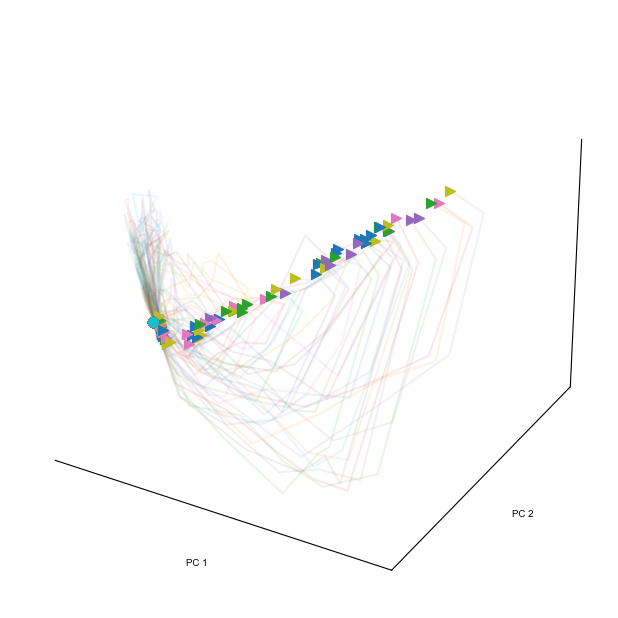

In [911]:
fig1, ax2 = plt.subplots(1, 1, sharey=True, sharex=True, figsize=(17,10))

fig2 = plt.figure(figsize=(17,10))
ax1 = fig2.add_subplot(1, 2, 1, projection='3d')

num_trial = 100
module_idx = 4
task_name = 'ctxdm1'
period = 'stimulus'

# activity = np.concatenate([activity_per_period_list_by_module[module_idx][0][i][task_name][period].squeeze(axis=1) for i in range(num_trial)])
activity = np.concatenate([activity_list_by_module[module_idx][0][i][task_name].squeeze(axis=1) for i in range(num_trial)])



pca2 = PCA(n_components=2)
pca2.fit(activity)
pca3 = PCA(n_components=3)
pca3.fit(activity)


for i in range(num_trial):
    # activity_pc3 = pca3.transform(activity_per_period_list_by_module[module_idx][0][i][task_name][period].squeeze(axis=1))
    activity_pc3 = pca3.transform(activity_list_by_module[module_idx][0][i][task_name].squeeze(axis=1))

    _ = ax1.plot(activity_pc3[:, 0], activity_pc3[:, 1], activity_pc3[:, 2], alpha=.1)
    _ = ax1.scatter(activity_pc3[-1, 0], activity_pc3[-1, 1], activity_pc3[-1, 2], s=50, marker='>')
    _ = ax1.scatter(activity_pc3[0, 0], activity_pc3[0, 1], activity_pc3[0, 2], s=50, marker='o')
    
    # activity_pc2 = pca2.transform(activity_per_period_list_by_module[module_idx][0][i][task_name][period].squeeze(axis=1))
    activity_pc2 = pca2.transform(activity_list_by_module[module_idx][0][i][task_name].squeeze(axis=1))

    _ = ax2.plot(activity_pc2[:, 0], activity_pc2[:, 1], alpha=.1)
    _ = ax2.scatter(activity_pc2[-1, 0], activity_pc2[-1, 1], s=50, marker='>')
    _ = ax2.scatter(activity_pc2[0, 0], activity_pc2[0, 1], s=50, marker='o')
    

ax2.set_xlabel('PC 1')
ax2.set_ylabel('PC 2')
style_3d_ax(ax1)
plt.show()

In [989]:
freq_range = 51
time_length = 40
freq = np.random.randint(10, freq_range + 1)

const_signal = np.repeat(freq / freq_range + 0.25, time_length)
const_signal = np.expand_dims(const_signal, axis=1)
const_signal_tensor = torch.from_numpy(np.array([const_signal]))

In [991]:
const_signal.shape

(40, 1)

### Dynamics

#### Approximate fixed points

In [885]:
input_list = {} # get activity for each trial
for i in range(num_tasks):
    env.new_trial()    
    ob, gt = env.ob, env.gt
    ob = ob[:, np.newaxis, :]
    inputs = torch.from_numpy(ob).type(torch.DoubleTensor).to(device)
    input_list[env.task.task_name] = inputs

In [893]:
input_list['ctxdm1'].shape

torch.Size([9, 1, 53])

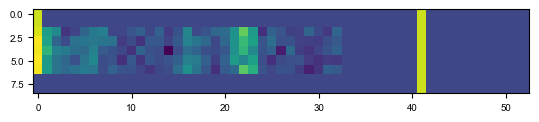

In [887]:
plt.imshow(input_list['ctxdm1'].detach().cpu().numpy().squeeze(axis=1))
plt.show()

In [895]:
np.tile([1, 0.5, 0.5], (batch_size, 1)).shape

(4, 3)

In [896]:
hidden_size

400

In [908]:
module_idx

4

In [918]:
activity_list_by_module[module_idx][1].shape

(15,)

In [920]:
activity.shape

(2000, 15)

In [950]:
# Freeze parameters in network 
for param in net.parameters():
    param.requires_grad = False
    
batch_size = activity_list_by_module[module_idx][1].shape[0]
task_input = torch.tensor(input_list['ctxdm1'])

# Hidden activity is variable to be optimized
# random initialization
hidden = torch.tensor(np.random.rand(batch_size, hidden_size)*3,  
                     requires_grad=True)

# Adam optimizer
optimizer = torch.optim.Adam([hidden], lr=0.001)
criterion = nn.MSELoss()

running_loss = 0
for i in range(10000):
    optimizer.zero_grad()   # zero the gradient buffers
    
    # Take the one-step recurrent function from the trained network
    new_h = net.rnn.recurrence(task_input, hidden)
    loss = criterion(new_h, hidden)
    loss.backward()
    optimizer.step()    # Does the update

    running_loss += loss.item()
    if i % 1000 == 999:
        running_loss /= 1000
        print('Step {}, Loss {:0.4f}'.format(i+1, running_loss))
        running_loss = 0



/var/folders/3l/tv69nng54nsdx0t5kvn28ksh0000gn/T/ipykernel_25701/3093428307.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  task_input = torch.tensor(input_list['ctxdm1'])
/Users/alexnegron/opt/anaconda3/envs/torch-gpu/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([15, 400])) that is different to the input size (torch.Size([9, 15, 400])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Step 1000, Loss 0.8455
Step 2000, Loss 0.2902
Step 3000, Loss 0.1140
Step 4000, Loss 0.0626
Step 5000, Loss 0.0438
Step 6000, Loss 0.0342
Step 7000, Loss 0.0323
Step 8000, Loss 0.0319
Step 9000, Loss 0.0318
Step 10000, Loss 0.0317


In [951]:
fixed_points = hidden.detach().numpy()
print(fixed_points.shape)

(15, 400)


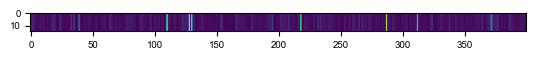

In [952]:
plt.imshow(fixed_points)
plt.show()

In [953]:
fixed_points_module = fixed_points[:, activity_list_by_module[module_idx][1]]

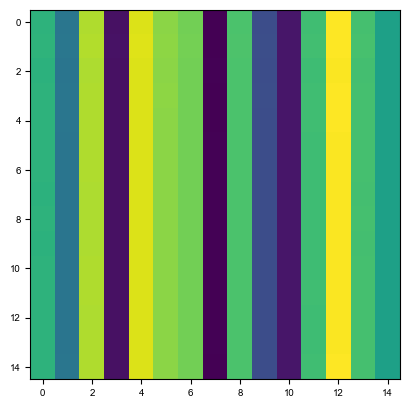

In [954]:
plt.imshow(fixed_points_module)

In [955]:
activity_list_by_module[module_idx][1].shape

(15,)

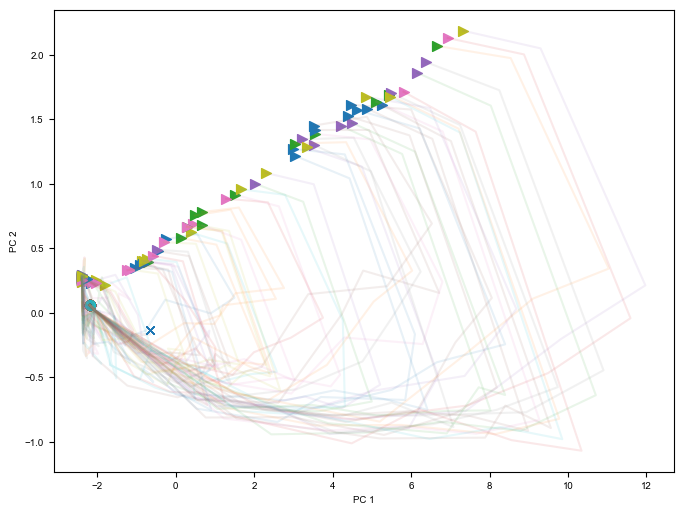

In [956]:
fig1, ax2 = plt.subplots(1, 1, sharey=True, sharex=True, figsize=(8,6))

num_trial = 100
module_idx = 4
task_name = 'ctxdm1'
period = 'stimulus'

# activity = np.concatenate([activity_per_period_list_by_module[module_idx][0][i][task_name][period].squeeze(axis=1) for i in range(num_trial)])
activity = np.concatenate([activity_list_by_module[module_idx][0][i][task_name].squeeze(axis=1) for i in range(num_trial)])



pca2 = PCA(n_components=2)
pca2.fit(activity)


for i in range(num_trial):
    # activity_pc2 = pca2.transform(activity_per_period_list_by_module[module_idx][0][i][task_name][period].squeeze(axis=1))
    activity_pc2 = pca2.transform(activity_list_by_module[module_idx][0][i][task_name].squeeze(axis=1))

    _ = ax2.plot(activity_pc2[:, 0], activity_pc2[:, 1], alpha=.1)
    _ = ax2.scatter(activity_pc2[-1, 0], activity_pc2[-1, 1], s=50, marker='>')
    _ = ax2.scatter(activity_pc2[0, 0], activity_pc2[0, 1], s=50, marker='o')
    
fixed_points_pc = pca2.transform(fixed_points_module)
ax2.plot(fixed_points_pc[:, 0], fixed_points_pc[:, 1], 'x')


ax2.set_xlabel('PC 1')
ax2.set_ylabel('PC 2')
plt.show()

In [961]:
fp.shape

torch.Size([400])

In [963]:
fixed_points.shape

(15, 400)

In [964]:
i_fp

2

In [962]:
task_input.shape

torch.Size([9, 1, 53])

In [966]:
torch.from_numpy(fixed_points[i_fp]).shape

torch.Size([400])

In [968]:
deltah.shape

torch.Size([9, 1, 400])

In [973]:
input = torch.tensor([1, 0.5, 0.5], dtype=torch.float32)

In [974]:
input.shape

torch.Size([3])

In [959]:
# index of fixed point to focus on
# choose one close to center by sorting PC1
i_fp = np.argsort(fixed_points[:, 0])[int(fixed_points.shape[0]/2)]

fp = torch.from_numpy(fixed_points[i_fp])
fp.requires_grad = True

# Inputs should be the 0-coherence mean input during stimulus period
# This will be task-specific
deltah = net.rnn.recurrence(task_input, fp) - fp

# w1 = torch.randn((64,64), requires_grad = False)                                                                                         
# new_h = w1@fp

jacT = torch.zeros(hidden_size, hidden_size)
for i in range(hidden_size):                                                                                                                     
    output = torch.zeros(hidden_size)                                                                                                          
    output[i] = 1.                                                                                                                     
    jacT[:,i] = torch.autograd.grad(deltah, fp, grad_outputs=output, retain_graph=True)[0]
    
jac = jacT.detach().numpy().T

RuntimeError: Mismatch in shape: grad_output[0] has a shape of torch.Size([400]) and output[0] has a shape of torch.Size([9, 1, 400]).

In [969]:
deltah.shape

torch.Size([9, 1, 400])

In [971]:
output.shape

torch.Size([400])